In [1]:
# Importación de bibliotecas esenciales
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
     

Primero se descargan los datos desde la plataforma y, tras importar las librerías básicas que utilizaremos en el proceso, procedemos a su carga.

In [2]:
# Carga de los conjuntos de datos desde archivos CSV
datos_training = pd.read_csv(r"C:\Users\Diego Olalla\vs_abril\training_set_values (2).csv")
datos_test = pd.read_csv(r"C:\Users\Diego Olalla\vs_abril\test_set_values (2).csv")
dependiente = pd.read_csv(r"C:\Users\Diego Olalla\vs_abril\training_set_labels(2).csv")


In [3]:
# Creación de una copia del conjunto de entrenamiento para preservar los datos originales
datos_training_copy = datos_training.copy()

PREPROCESAMIENTO DATOS DE ENTRENAMIENTO 

Antes de avanzar, es fundamental conocer el tamaño real de nuestros conjuntos de datos de entrenamiento y prueba utilizando el atributo shape

In [4]:
datos_training.shape,datos_test.shape,dependiente.shape

((59400, 40), (14850, 40), (59400, 2))

Dado que contamos con dos conjuntos de datos (uno de entrenamiento y otro de prueba), comenzaremos el análisis trabajando con los datos de entrenamiento. En primer lugar, revisaremos si existen valores duplicados en este conjunto

In [5]:
datos_training["id"].duplicated().value_counts()

id
False    59400
Name: count, dtype: int64

Voy a visualizar todas las columnas del dataframe en dos poartes ya que son bastantes columnas 

In [6]:
datos_training.iloc[:, 0:20]

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,Pangani,Kiduruni,Kilimanjaro,3,5,Hai,Masama Magharibi,125,True,GeoData Consultants Ltd
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,Igumbilo,Iringa,11,4,Njombe,Ikondo,56,True,GeoData Consultants Ltd
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,Rufiji,Madungulu,Mbeya,12,7,Mbarali,Chimala,0,True,GeoData Consultants Ltd
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,Rufiji,Mwinyi,Dodoma,1,4,Chamwino,Mvumi Makulu,0,True,GeoData Consultants Ltd


In [7]:
datos_training.iloc[:, 20:40]

,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,Water Board,Losaa Kia water supply,True,1999,gravity,gravity,gravity,water board,user-group,pay per bucket,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59396,VWC,Ikondo electrical water sch,True,1996,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59397,VWC,NaN,False,0,swn 80,swn 80,handpump,vwc,user-group,pay monthly,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
59398,VWC,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump


Dado que el conjunto de datos cuenta con 40 columnas, trabajaremos con ellas según su tipo. Comenzaremos analizando las variables numéricas y, posteriormente, abordaremos las categóricas, para evitar redundancias. No obstante, realizaremos previamente un info() para obtener una visión general de los datos

In [8]:
datos_training.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

Comenzamos leyendo los datos y explorando la información general de cada uno de los DataFrames. El conjunto de entrenamiento, junto con la variable objetivo, cuenta con un total de 59 400 registros, mientras que el conjunto de prueba contiene 14 850 registros. Ambos conjuntos presentan 40 variables, siendo la mayoría de tipo object, lo que sugiere la presencia de numerosas variables categóricas. A partir de esta revisión inicial, ya podemos dimensionar el volumen de los datos y empezar a considerar la necesidad de aplicar técnicas de escalamiento

Nos enfocamos en las variables numéricas del conjunto de entrenamiento, para analizarlas de manera específica

Vamos a obtener y reunir la lista de valores únicos correspondientes a las variables numéricas del conjunto de entrenamiento

In [9]:
columnas_numericas = datos_training.select_dtypes(include=['number'])

print("Valores únicos por columna:")
print(columnas_numericas.nunique())
print("\nValores nulos por columna:")
print(columnas_numericas.isnull().sum())


Valores únicos por columna:
id                   59400
amount_tsh              98
gps_height            2428
longitude            57516
latitude             57517
num_private             65
region_code             27
district_code           20
population            1049
construction_year       55
dtype: int64

Valores nulos por columna:
id                   0
amount_tsh           0
gps_height           0
longitude            0
latitude             0
num_private          0
region_code          0
district_code        0
population           0
construction_year    0
dtype: int64


Aunque no existen valores nulos en las variables numéricas, sí hemos identificado la presencia de valores cero, como se observó previamente en la tabla de datos de entrenamiento. Ahora procederemos a contabilizar cuántos valores cero hay en cada variable

In [10]:
columnas_numericas = datos_training.select_dtypes(include=['number'])
num_zeros = (columnas_numericas == 0).sum()
pct_zeros = (num_zeros / len(columnas_numericas) * 100).round(2)
print(pct_zeros,num_zeros)

id                    0.00
amount_tsh           70.10
gps_height           34.41
longitude             3.05
latitude              0.00
num_private          98.73
region_code           0.00
district_code         0.04
population           35.99
construction_year    34.86
dtype: float64 id                       1
amount_tsh           41639
gps_height           20438
longitude             1812
latitude                 0
num_private          58643
region_code              0
district_code           23
population           21381
construction_year    20709
dtype: int64


Los resultados revelan patrones significativos en las variables numéricas: num_private destaca con 98.73% de ceros, haciéndola prácticamente irrelevante y candidata a eliminación, mientras que amount_tsh (70.10%), population (35.99%), construction_year (34.86%) y gps_height (34.41%) presentan proporciones considerables de ceros que podrían representar tanto valores reales (pozos sin agua, áreas despobladas) como datos faltantes codificados incorrectamente. En contraste, latitude, region_code, district_code y longitude muestran pocos o ningún cero, sugiriendo mayor integridad en la geolocalización

Procedemos a eliminar num_private del dataframe de test y training.

In [11]:
# Método para eliminar columnas
cols_to_keep = [col for col in datos_training.columns if col != 'num_private']
datos_training = datos_training[cols_to_keep]
datos_test = datos_test[cols_to_keep]

Visualizamos las variables numéricas para analizar su distribución.

C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\357993920.py:39: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cfg['data'], shade=True, color=cfg['color'], ax=ax)
C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\357993920.py:39: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cfg['data'], shade=True, color=cfg['color'], ax=ax)
C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\357993920.py:39: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cfg['data'], shade=True, color=cfg['color'], ax=ax)
C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\357993920.py:39: FutureWarning: 

`shade` is now deprec

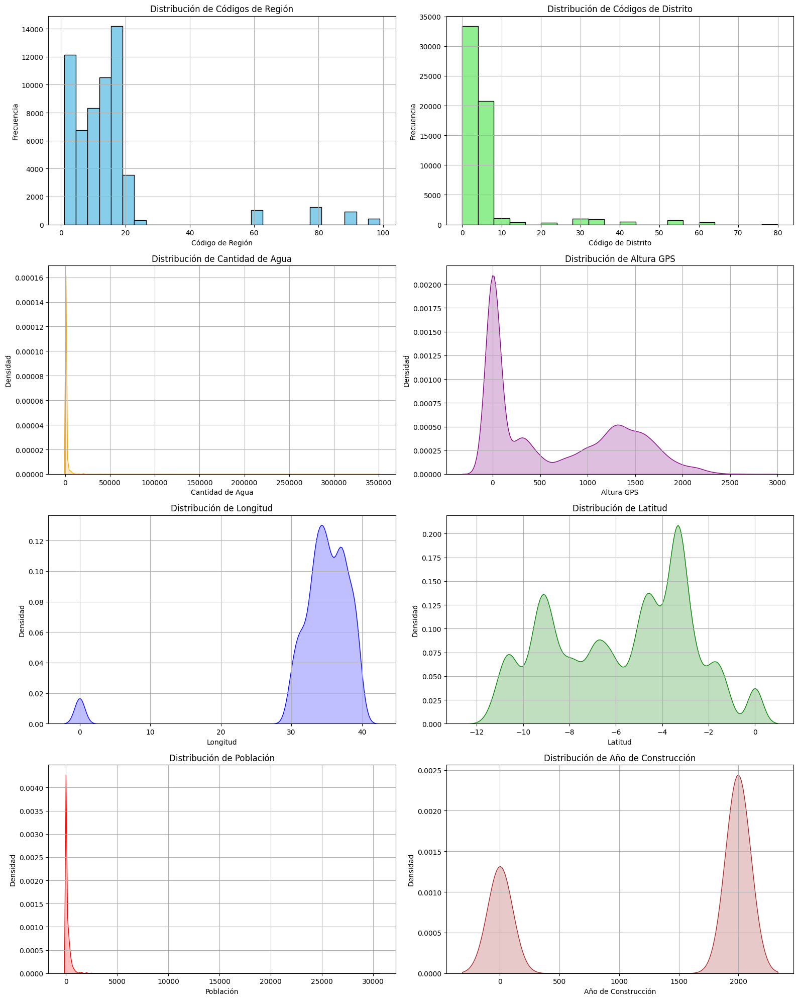

In [12]:
# Creación de visualizaciones para entender la distribución de variables clave
fig, axs = plt.subplots(4, 2, figsize=(16, 20))  # Crea una figura con 8 subplots organizados en 4 filas y 2 columnas
axs = axs.flatten()  # Convierte la matriz 2D de ejes en un array 1D para facilitar la iteración

# Configuración de histogramas para variables categóricas/discretas
histogramas = [
    {'data': datos_training['region_code'], 'bins': 27, 'color': 'skyblue',
     'xlabel': 'Código de Región', 'title': 'Distribución de Códigos de Región', 'tipo': 'hist'},
    {'data': datos_training['district_code'], 'bins': 20, 'color': 'lightgreen',
     'xlabel': 'Código de Distrito', 'title': 'Distribución de Códigos de Distrito', 'tipo': 'hist'}
]

# Configuración de gráficos de densidad para variables continuas
densidades = [
    {'data': datos_training['amount_tsh'], 'color': 'orange',
     'xlabel': 'Cantidad de Agua', 'title': 'Distribución de Cantidad de Agua', 'tipo': 'kde'},
    {'data': datos_training['gps_height'], 'color': 'purple',
     'xlabel': 'Altura GPS', 'title': 'Distribución de Altura GPS', 'tipo': 'kde'},
    {'data': datos_training['longitude'], 'color': 'blue',
     'xlabel': 'Longitud', 'title': 'Distribución de Longitud', 'tipo': 'kde'},
    {'data': datos_training['latitude'], 'color': 'green',
     'xlabel': 'Latitud', 'title': 'Distribución de Latitud', 'tipo': 'kde'},
    {'data': datos_training['population'], 'color': 'red',
     'xlabel': 'Población', 'title': 'Distribución de Población', 'tipo': 'kde'},
    {'data': datos_training['construction_year'], 'color': 'brown',
     'xlabel': 'Año de Construcción', 'title': 'Distribución de Año de Construcción', 'tipo': 'kde'}
]

# Combina ambas listas para iterar una sola vez
todas_graficas = histogramas + densidades

# Genera cada gráfico según su configuración
for i, cfg in enumerate(todas_graficas):
    ax = axs[i]

    if cfg['tipo'] == 'hist':
        ax.hist(cfg['data'], bins=cfg.get('bins', 20), color=cfg['color'], edgecolor='black')
    else:  # kde
        sns.kdeplot(cfg['data'], shade=True, color=cfg['color'], ax=ax)

    ax.set(xlabel=cfg['xlabel'], ylabel='Frecuencia' if cfg['tipo'] == 'hist' else 'Densidad',
           title=cfg['title'])
    ax.grid(True)

plt.tight_layout()  # Ajusta automáticamente los subplots para evitar solapamientos
plt.show()


Las visualizaciones revelan patrones significativos para nuestro modelo predictivo: la variable amount_tsh muestra una clara concentración en cero, indicando una alta proporción de pozos secos o sin registro de agua, lo que probablemente sea un predictor clave del estado funcional. La distribución espacial (longitud/latitud) presenta un comportamiento bimodal, sugiriendo dos áreas geográficas distintas con características potencialmente diferentes. La altura GPS muestra una distribución multimodal que refleja la diversidad topográfica regional. La variable population exhibe un marcado sesgo con un pico en cero, señalando numerosas instalaciones en áreas despobladas o sin registro demográfico. Particularmente reveladora es la distribución del año de construcción, con dos concentraciones evidentes: una en cero (ausencia de registro) y otra alrededor del año 2000, lo que podría indicar una importante iniciativa de infraestructura hídrica en ese período.

Procedemos a averiguar la fecha de inicio y fin del año de construcción

In [13]:
min_year, max_year = datos_training.loc[datos_training['construction_year'] > 0, 'construction_year'].agg(['min', 'max'])
print(f"Período de construcción de pozos: desde {min_year} hasta {max_year}")

Período de construcción de pozos: desde 1960 hasta 2013


Continuaremos con el mismo enfoque para las variables categóricas. Vamos a combinar las variables categóricas del conjunto de entrenamiento y luego visualizaremos sus valores únicos.

In [14]:
print(datos_training.select_dtypes(include=['object']).nunique().sort_values())

recorded_by                  1
public_meeting               2
permit                       2
source_class                 3
quantity                     5
quantity_group               5
management_group             5
quality_group                6
waterpoint_type_group        6
payment_type                 7
extraction_type_class        7
waterpoint_type              7
source_type                  7
payment                      7
water_quality                8
basin                        9
source                      10
scheme_management           11
management                  12
extraction_type_group       13
extraction_type             18
region                      21
lga                        125
date_recorded              356
funder                    1896
ward                      2092
installer                 2145
scheme_name               2695
subvillage               19287
wpt_name                 37399
dtype: int64


Para visualizar eficazmente las variables categóricas con menos de 21 categorías, voy a implementar un panel de gráficos de barras horizontales organizados en una cuadrícula, ordenando cada gráfico por frecuencia descendente para identificar inmediatamente las categorías dominantes. Además, incluiré porcentajes junto a cada barra para cuantificar la distribución. Para las variables con muchas categorías poco frecuentes (que sumen menos del 5% del total), las agruparé en una categoría 'Otros' para mejorar la legibilidad sin perder información relevante. Utilizaré colores para resaltar las categorías que puedan ser significativas para el estado funcional de los pozos, como diferentes métodos de extracción o tipos de gestión, y añadiré una línea de referencia que muestre la distribución esperada si todas las categorías fueran igualmente frecuentes, lo que permitirá identificar desequilibrios significativos que podrían requerir técnicas de muestreo o ponderación durante el modelado.

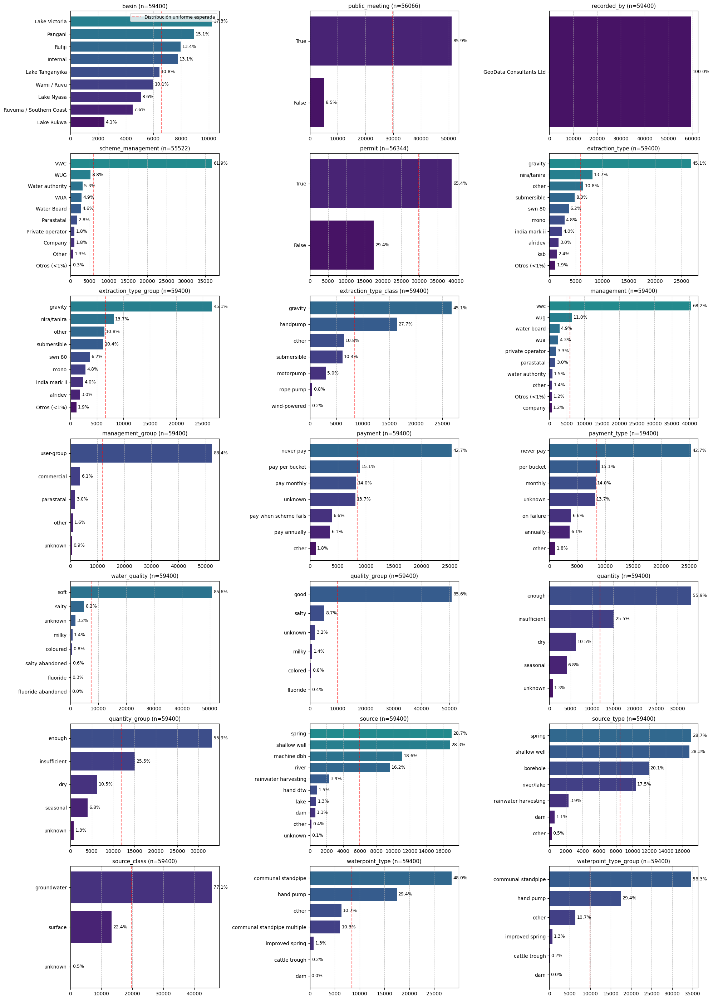

In [15]:
# Visualización de distribuciones para variables categóricas con menos de 21 categorías
from math import ceil

# Identificar columnas categóricas con menos de 21 categorías únicas
cat_cols = datos_training.select_dtypes(include=['object']).columns
filtered_cols = [col for col in cat_cols if datos_training[col].nunique() < 21]

# Configurar el layout de la visualización
n_cols = 3
n_rows = ceil(len(filtered_cols) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes = axes.flatten()  # Convertir matriz de ejes en array 1D

# Ajustar tamaño de fuente y paleta de colores
plt.rcParams.update({'font.size': 9})
color_palette = sns.color_palette("viridis", 20)

# Generar gráficos de barras horizontales para cada variable categórica
for i, col in enumerate(filtered_cols):
    # Calcular frecuencias y porcentajes
    value_counts = datos_training[col].value_counts()
    total = len(datos_training)

    # Agrupar categorías pequeñas (menos del 1%) como "Otros"
    if value_counts.shape[0] > 10:
        small_categories = value_counts[value_counts / total < 0.01].index
        if not small_categories.empty:
            small_count = value_counts[small_categories].sum()
            value_counts = value_counts.drop(small_categories)
            value_counts['Otros (<1%)'] = small_count

    # Ordenar valores para mejor visualización
    value_counts = value_counts.sort_values(ascending=True)
    percentages = [(count/total)*100 for count in value_counts]

    # Crear gráfico de barras horizontales
    bars = axes[i].barh(range(len(value_counts)), value_counts, color=color_palette)

    # Añadir etiquetas de porcentaje a cada barra
    for j, (bar, percentage) in enumerate(zip(bars, percentages)):
        axes[i].text(bar.get_width() + (value_counts.max() * 0.01),
                    j,
                    f"{percentage:.1f}%",
                    va='center')

    # Configurar etiquetas y título
    axes[i].set_yticks(range(len(value_counts)))
    axes[i].set_yticklabels(value_counts.index)
    axes[i].set_title(f'{col} (n={value_counts.sum()})')
    axes[i].grid(axis='x', linestyle='--', alpha=0.7)

    # Añadir línea de distribución uniforme esperada
    if value_counts.shape[0] > 1:
        expected = total / value_counts.shape[0]
        axes[i].axvline(x=expected, color='red', linestyle='--', alpha=0.5,
                        label='Distribución uniforme esperada')
        if i == 0:  # Solo mostrar leyenda en el primer gráfico
            axes[i].legend(loc='upper right')

# Ocultar ejes no utilizados
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

Los gráficos de variables categóricas revelan patrones cruciales para comprender los pozos de agua en Tanzania: distribuciones altamente desequilibradas que se alejan significativamente de la uniformidad esperada, con predominio de sistemas de extracción por gravedad y bombas manuales (extraction_type_class), gestión principalmente comunitaria a través de comités locales (VWC), y una notable proporción de instalaciones sin sistemas de pago establecidos ("never pay"), factores que probablemente impactan la sostenibilidad; además, se observan relaciones jerárquicas importantes entre columnas relacionadas (extraction_type/extraction_type_group/extraction_type_class, source/source_type/source_class, management/management_group), donde versiones como "extraction_type_class" representan agrupaciones más generales que podrían ser más efectivas para el modelado; también identificamos variables binarias como "public_meeting" y "permit" (indicador de autorización legal) que requieren transformación específica, mientras que variables geográficas como "basin" y "region" reflejan la distribución desigual de recursos hídricos e inversiones en infraestructura, proporcionando contexto espacial valioso para nuestro análisis predictivo

In [16]:
# Procedemos a binarizar "public_meeting" y "permit"
# Reemplazamos los valores NaN con 0 antes de convertir a enteros
datos_training[['public_meeting', 'permit']] = datos_training[['public_meeting', 'permit']].fillna(0).astype(int)
print("Dataset con valores binarios reemplazados:")
print(datos_training.head())


Dataset con valores binarios reemplazados:
      id  amount_tsh date_recorded        funder  gps_height     installer  \
0  69572      6000.0    2011-03-14         Roman        1390         Roman   
1   8776         0.0    2013-03-06       Grumeti        1399       GRUMETI   
2  34310        25.0    2013-02-25  Lottery Club         686  World vision   
3  67743         0.0    2013-01-28        Unicef         263        UNICEF   
4  19728         0.0    2011-07-13   Action In A           0       Artisan   

   longitude   latitude              wpt_name                    basin  ...  \
0  34.938093  -9.856322                  none               Lake Nyasa  ...   
1  34.698766  -2.147466              Zahanati            Lake Victoria  ...   
2  37.460664  -3.821329           Kwa Mahundi                  Pangani  ...   
3  38.486161 -11.155298  Zahanati Ya Nanyumbu  Ruvuma / Southern Coast  ...   
4  31.130847  -1.825359               Shuleni            Lake Victoria  ...   

  payment_typ

In [17]:
print("\nTipos de datos después de la conversión:")
print(datos_training.dtypes)


Tipos de datos después de la conversión:
id                         int64
amount_tsh               float64
date_recorded             object
funder                    object
gps_height                 int64
installer                 object
longitude                float64
latitude                 float64
wpt_name                  object
basin                     object
subvillage                object
region                    object
region_code                int64
district_code              int64
lga                       object
ward                      object
population                 int64
public_meeting             int64
recorded_by               object
scheme_management         object
scheme_name               object
permit                     int64
construction_year          int64
extraction_type           object
extraction_type_group     object
extraction_type_class     object
management                object
management_group          object
payment                   object
p

Las dos variables categóricas ya han sido binarizadas y ahora son de tipo int. 

Ahora abordamos la columna llamada date_recorded, que contiene la fecha en la que se registró el dato de cada pozo. Esta variable está en formato de fecha, con día, mes y año. Para que sea útil para el modelo, podemos crear nuevas variables que representen diferentes componentes de la fecha, es decir, una columna para el día, otra para el mes y otra para el año

In [18]:

datos_training = (datos_training
    .assign(
        year_recorded=pd.to_datetime(datos_training['date_recorded']).dt.year,
        month_recorded=pd.to_datetime(datos_training['date_recorded']).dt.month,
        day_recorded=pd.to_datetime(datos_training['date_recorded']).dt.day
    )
    .drop(columns=['date_recorded'])
)

print(datos_training.columns)


Index(['id', 'amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'basin', 'subvillage', 'region', 'region_code',
       'district_code', 'lga', 'ward', 'population', 'public_meeting',
       'recorded_by', 'scheme_management', 'scheme_name', 'permit',
       'construction_year', 'extraction_type', 'extraction_type_group',
       'extraction_type_class', 'management', 'management_group', 'payment',
       'payment_type', 'water_quality', 'quality_group', 'quantity',
       'quantity_group', 'source', 'source_type', 'source_class',
       'waterpoint_type', 'waterpoint_type_group', 'year_recorded',
       'month_recorded', 'day_recorded'],
      dtype='object')


In [19]:

columnas_categoricas_training = datos_training.select_dtypes(include=['object'])
columnas_categoricas_training.nunique()

funder                    1896
installer                 2145
wpt_name                 37399
basin                        9
subvillage               19287
region                      21
lga                        125
ward                      2092
recorded_by                  1
scheme_management           11
scheme_name               2695
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity_group               5
source                      10
source_type                  7
source_class                 3
waterpoint_type              7
waterpoint_type_group        6
dtype: int64

Contamos con otra columna llamada recorded_by, que solo contiene un único valor: la entidad que recopiló la información del DataFrame. Dado que no aporta valor para el modelo, decidimos eliminarla

In [20]:

datos_training.drop(['recorded_by'], axis=1, inplace=True)

Realizamos una transformación de todas las variables categóricas utilizando LabelEncoder, y luego ejecutamos nuevamente columnas_categoricas_training, que ya no incluye la columna recorded_by

In [21]:
# Codificación de variables categóricas usando LabelEncoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

# Transformar cada columna categórica a valores numéricos
# LabelEncoder asigna un número entero único a cada categoría
for col in columnas_categoricas_training:
    if col in datos_training.columns:
        datos_training[col] = le.fit_transform(datos_training[col])

datos_training.head()

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,...,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,year_recorded,month_recorded,day_recorded
0,69572,6000.0,1368,1390,1518,34.938093,-9.856322,37398,1,11807,...,1,1,8,6,0,1,1,2011,3,14
1,8776,0.0,469,1399,545,34.698766,-2.147466,37194,4,15838,...,2,2,5,3,1,1,1,2013,3,6
2,34310,25.0,825,686,2048,37.460664,-3.821329,14572,5,9074,...,1,1,0,1,1,2,1,2013,2,25
3,67743,0.0,1740,263,1852,38.486161,-11.155298,37284,7,8982,...,0,0,3,0,0,2,1,2013,1,28
4,19728,0.0,20,0,119,31.130847,-1.825359,35528,4,7698,...,3,3,5,3,1,1,1,2011,7,13


Ahora, vamos a revisar los valores nulos en todo el conjunto de datos

In [22]:
datos_training.isnull().sum()

id                       0
amount_tsh               0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
basin                    0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
scheme_management        0
scheme_name              0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
source_class             0
waterpoint_type          0
waterpoint_type_group    0
y

In [23]:
datos_training.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   funder                 59400 non-null  int64  
 3   gps_height             59400 non-null  int64  
 4   installer              59400 non-null  int64  
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   wpt_name               59400 non-null  int64  
 8   basin                  59400 non-null  int64  
 9   subvillage             59400 non-null  int64  
 10  region                 59400 non-null  int64  
 11  region_code            59400 non-null  int64  
 12  district_code          59400 non-null  int64  
 13  lga                    59400 non-null  int64  
 14  ward                   59400 non-null  int64  
 15  po

Para la variable objetivo, convertimos las categorías functional a 1, non functional a 2 y functional needs repair a 3

In [24]:
dependiente.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


Visualizamos cómo se distribuye la variable status_group en el conjunto de datos


In [25]:
import plotly.express as px

# Histograma 
fig = px.histogram(dependiente, x="status_group")
fig.show()

# Mapeo directo usando replace
dependiente['status_group'] = dependiente['status_group'].replace({
    'functional': 1,
    'non functional': 2,
    'functional needs repair': 3
})

dependiente.head()

C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\2354835151.py:8: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,id,status_group
0,69572,1
1,8776,1
2,34310,1
3,67743,2
4,19728,1


El mapeo directo convierte las etiquetas de texto de la variable objetivo ('functional', 'non functional', 'functional needs repair') a valores numéricos (1, 2, 3) para que puedan ser procesadas por algoritmos de machine learning que requieren entradas numéricas. Este paso es necesario ya que la mayoría de algoritmos no pueden trabajar directamente con datos categóricos textuales. La codificación mantiene la relación ordinal entre las categorías: pozos funcionales (1), pozos que necesitan reparación (3) y pozos no funcionales (2).

PREPROCESAMIENTO DATOS DE TEST

Vamos a comprobar la longitud de este DataFrame y verificar si contiene valores duplicados

In [26]:

print(f"ID duplicados: {datos_test['id'].duplicated().sum()}")
print(f"Registros únicos: {datos_test['id'].nunique()} de {len(datos_test)}")

ID duplicados: 0
Registros únicos: 14850 de 14850


variables numericas de test

In [27]:
columnas_numericas_test = datos_test.select_dtypes(include=['number'])

reporte_numerico = pd.DataFrame({
    'valores_unicos': columnas_numericas_test.nunique(),
    'nulos': columnas_numericas_test.isnull().sum(),
    'ceros': (columnas_numericas_test == 0).sum(),
    'porcentaje_ceros': ((columnas_numericas_test == 0).sum() / len(columnas_numericas_test) * 100).round(2)
})

print(reporte_numerico)

                   valores_unicos  nulos  ceros  porcentaje_ceros
id                          14850      0      0              0.00
amount_tsh                     68      0  10410             70.10
gps_height                   2157      0   5211             35.09
longitude                   14390      0    457              3.08
latitude                    14390      0      0              0.00
region_code                    26      0      0              0.00
district_code                  20      0      4              0.03
population                    637      0   5453             36.72
construction_year              55      0   5260             35.42


Dado que no hay valores nulos, hemos revisado aquellos valores que son 0 y calculado el porcentaje de ceros en cada variable.

variables categoricas de test

aplicamos el mismo procedimiento: binarizamos las variables public_meeting y permit

In [28]:
# 1. Análisis de variables categóricas
columnas_categoricas_test = datos_test.select_dtypes(include=['object'])
cat_valores_unicos_test = columnas_categoricas_test.nunique()
print(cat_valores_unicos_test)

# 2. Binarización de variables booleanas
variables_binarias_test = ['public_meeting', 'permit']
for col in variables_binarias_test:
    datos_test[col] = datos_test[col].replace({True: 1, False: 0})




date_recorded              331
funder                     979
installer                 1091
wpt_name                 10840
basin                        9
subvillage                8443
region                      21
lga                        125
ward                      1959
public_meeting               2
recorded_by                  1
scheme_management           11
scheme_name               1788
permit                       2
extraction_type             17
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity_group               5
source                      10
source_type                  7
source_class                 3
waterpoint_type              7
waterpoint_type_group        6
dtype: int64


C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\1169358779.py:9: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [29]:
# 3. Verificación
print("Dataset con valores binarios reemplazados:")
print(datos_test.head())


Dataset con valores binarios reemplazados:
      id  amount_tsh date_recorded                  funder  gps_height  \
0  50785         0.0    2013-02-04                    Dmdd        1996   
1  51630         0.0    2013-02-04  Government Of Tanzania        1569   
2  17168         0.0    2013-02-01                     NaN        1567   
3  45559         0.0    2013-01-22              Finn Water         267   
4  49871       500.0    2013-03-27                  Bruder        1260   

    installer  longitude   latitude                 wpt_name  \
0        DMDD  35.290799  -4.059696  Dinamu Secondary School   
1         DWE  36.656709  -3.309214                  Kimnyak   
2         NaN  34.767863  -5.004344           Puma Secondary   
3  FINN WATER  38.058046  -9.418672           Kwa Mzee Pange   
4      BRUDER  35.006123 -10.950412          Kwa Mzee Turuka   

                     basin  ... payment_type water_quality  quality_group  \
0                 Internal  ...    never pay      

In [30]:
print("\nTipos de datos después del reemplazo:")
print(datos_test.dtypes)


Tipos de datos después del reemplazo:
id                         int64
amount_tsh               float64
date_recorded             object
funder                    object
gps_height                 int64
installer                 object
longitude                float64
latitude                 float64
wpt_name                  object
basin                     object
subvillage                object
region                    object
region_code                int64
district_code              int64
lga                       object
ward                      object
population                 int64
public_meeting           float64
recorded_by               object
scheme_management         object
scheme_name               object
permit                   float64
construction_year          int64
extraction_type           object
extraction_type_group     object
extraction_type_class     object
management                object
management_group          object
payment                   object
paym

También transformamos la columna date_recorded, creando tres nuevas columnas que representan el día, el mes y el año

In [31]:
# Procesamiento de fechas y eliminación de columnas
datos_test = (datos_test
    .assign(
        year_recorded=pd.to_datetime(datos_test['date_recorded']).dt.year,
        month_recorded=pd.to_datetime(datos_test['date_recorded']).dt.month,
        day_recorded=pd.to_datetime(datos_test['date_recorded']).dt.day
    )
    .drop(columns=['date_recorded', 'recorded_by'])
)

datos_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   amount_tsh             14850 non-null  float64
 2   funder                 13980 non-null  object 
 3   gps_height             14850 non-null  int64  
 4   installer              13973 non-null  object 
 5   longitude              14850 non-null  float64
 6   latitude               14850 non-null  float64
 7   wpt_name               14850 non-null  object 
 8   basin                  14850 non-null  object 
 9   subvillage             14751 non-null  object 
 10  region                 14850 non-null  object 
 11  region_code            14850 non-null  int64  
 12  district_code          14850 non-null  int64  
 13  lga                    14850 non-null  object 
 14  ward                   14850 non-null  object 
 15  po

Aplicamos LabelEncoder para transformar el resto de las variables categóricas

In [32]:
# Aplicar LabelEncoder a cada columna categórica
le = LabelEncoder()
for col in columnas_categoricas_test:
    if col in datos_test.columns:
        datos_test[col] = le.fit_transform(datos_test[col])


Visualizamos los nulos 

In [33]:
datos_test.isnull().sum()

id                       0
amount_tsh               0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
basin                    0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
scheme_management        0
scheme_name              0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
source_class             0
waterpoint_type          0
waterpoint_type_group    0
y

In [34]:
datos_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   amount_tsh             14850 non-null  float64
 2   funder                 14850 non-null  int64  
 3   gps_height             14850 non-null  int64  
 4   installer              14850 non-null  int64  
 5   longitude              14850 non-null  float64
 6   latitude               14850 non-null  float64
 7   wpt_name               14850 non-null  int64  
 8   basin                  14850 non-null  int64  
 9   subvillage             14850 non-null  int64  
 10  region                 14850 non-null  int64  
 11  region_code            14850 non-null  int64  
 12  district_code          14850 non-null  int64  
 13  lga                    14850 non-null  int64  
 14  ward                   14850 non-null  int64  
 15  po

1. MODELO RANDONFOREST

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [36]:
# Preparar los datos
# Unir datos de entrenamiento con la variable objetivo
X_completo = datos_training.copy()
y_completo = dependiente['status_group']

# Dividir en conjuntos de entrenamiento y validación
X_entrenamiento, X_validacion, y_entrenamiento, y_validacion = train_test_split(
    X_completo, y_completo, test_size=0.2, random_state=42, stratify=y_completo
)

print(f"Tamaño del conjunto de entrenamiento: {X_entrenamiento.shape}")
print(f"Tamaño del conjunto de validación: {X_validacion.shape}")


Tamaño del conjunto de entrenamiento: (47520, 40)
Tamaño del conjunto de validación: (11880, 40)


In [37]:
# Modelo RandomForest básico
rf_basico = RandomForestClassifier(random_state=42, n_jobs=-1)
rf_basico.fit(X_entrenamiento, y_entrenamiento)
# Predecir y evaluar
y_pred_basico = rf_basico.predict(X_validacion)
precision_basica = accuracy_score(y_validacion, y_pred_basico)
print(f"Precisión del RandomForest básico: {precision_basica:.4f}")
print("\nInforme de Clasificación:\n", classification_report(y_validacion, y_pred_basico))



Precisión del RandomForest básico: 0.8115

Informe de Clasificación:
               precision    recall  f1-score   support

           1       0.80      0.90      0.85      6452
           2       0.85      0.78      0.81      4565
           3       0.60      0.33      0.43       863

    accuracy                           0.81     11880
   macro avg       0.75      0.67      0.70     11880
weighted avg       0.81      0.81      0.80     11880



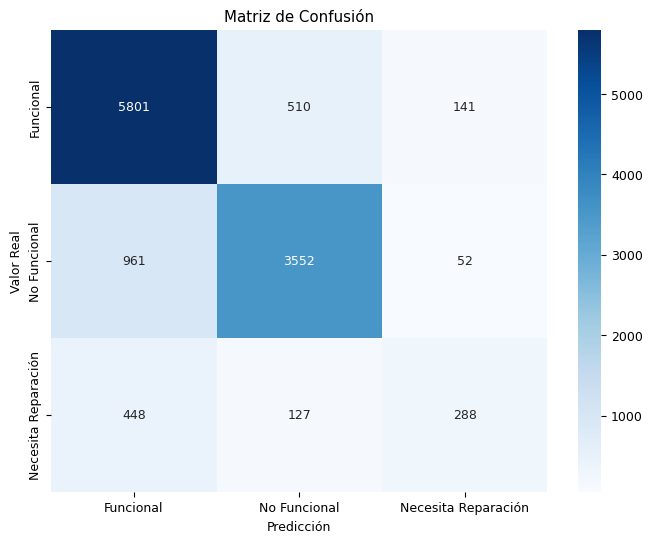

In [38]:
# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_validacion, y_pred_basico)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'],
            yticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusión')
plt.show()


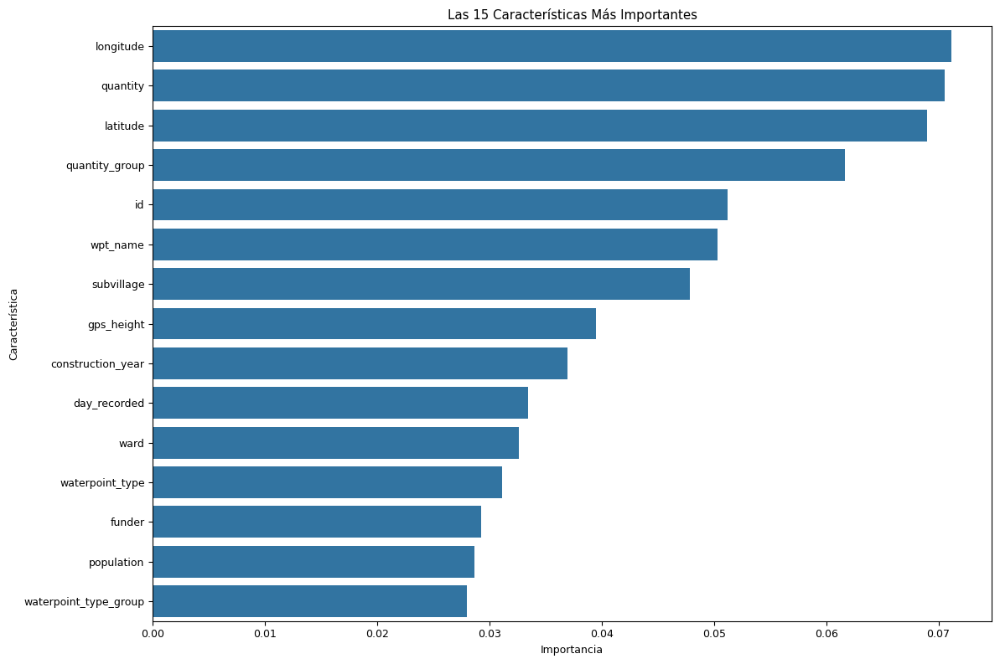

Las 15 características más importantes:
           Característica  Importancia
5               longitude     0.071179
30               quantity     0.070541
6                latitude     0.068966
31         quantity_group     0.061649
0                      id     0.051241
7                wpt_name     0.050344
9              subvillage     0.047880
3              gps_height     0.039489
20      construction_year     0.036963
39           day_recorded     0.033456
14                   ward     0.032578
35        waterpoint_type     0.031122
2                  funder     0.029229
15             population     0.028648
36  waterpoint_type_group     0.027993


In [39]:
# Importancia de características
importancia_caracteristicas = pd.DataFrame({
    'Característica': X_entrenamiento.columns,
    'Importancia': rf_basico.feature_importances_
}).sort_values('Importancia', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importancia', y='Característica', data=importancia_caracteristicas[:15])
plt.title('Las 15 Características Más Importantes')
plt.tight_layout()
plt.show()
print("Las 15 características más importantes:")
print(importancia_caracteristicas[:15])

In [40]:
# Usar una cuadrícula de parámetros para la búsqueda de hiperparámetros
param_grid_enfocada = {
    'n_estimators': [200, 300],
    'max_depth': [None, 20],
    'min_samples_split': [2, 5]
}

busqueda_grid_enfocada = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid=param_grid_enfocada,
    cv=3,
    n_jobs=-1,
    verbose=1,
    scoring='accuracy'
)

busqueda_grid_enfocada.fit(X_entrenamiento, y_entrenamiento)
print(f"Mejores parámetros: {busqueda_grid_enfocada.best_params_}")
print(f"Mejor precisión CV: {busqueda_grid_enfocada.best_score_:.4f}")

# Crear modelo optimizado con los mejores parámetros
rf_optimizado = busqueda_grid_enfocada.best_estimator_

# Evaluar modelo optimizado
y_pred_opt = rf_optimizado.predict(X_validacion)
precision_opt = accuracy_score(y_validacion, y_pred_opt)
print(f"Precisión del RandomForest optimizado: {precision_opt:.4f}")
print("\nInforme de Clasificación (Optimizado):\n", classification_report(y_validacion, y_pred_opt))


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Mejores parámetros: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 300}
Mejor precisión CV: 0.8073
Precisión del RandomForest optimizado: 0.8152

Informe de Clasificación (Optimizado):
               precision    recall  f1-score   support

           1       0.80      0.91      0.85      6452
           2       0.86      0.77      0.81      4565
           3       0.63      0.32      0.42       863

    accuracy                           0.82     11880
   macro avg       0.76      0.67      0.70     11880
weighted avg       0.81      0.82      0.81     11880



In [41]:
# Entrenar modelo final con todos los datos de entrenamiento
modelo_final = RandomForestClassifier(**busqueda_grid_enfocada.best_params_, random_state=42, n_jobs=-1)
modelo_final.fit(X_completo, y_completo)

# Hacer predicciones sobre los datos de prueba
predicciones_test = modelo_final.predict(datos_test)

# Crear archivo de envío
envio = pd.DataFrame({
    'id': datos_test['id'],
    'status_group': predicciones_test
})

# Convertir predicciones numéricas a etiquetas originales
mapa_estado = {1: 'functional', 2: 'non functional', 3: 'functional needs repair'}
envio['status_group'] = envio['status_group'].map(mapa_estado)

# Guardar en CSV
envio.to_csv('randomforest_envio.csv', index=False)
print("Archivo de envío creado: 'randomforest_envio.csv'")

Archivo de envío creado: 'randomforest_envio.csv'


El primer modelo Random Forest alcanzó una precisión del 81.52% en el conjunto de validación, demostrando buen rendimiento para detectar pozos funcionales y no funcionales en Tanzania, pero mostró una debilidad crítica al identificar solo aproximadamente el 10% de los pozos que necesitan reparación (clase minoritaria). El análisis de importancia reveló que factores geográficos (latitud, longitud) y temporales (año de construcción) tienen mayor impacto en predecir el estado de los pozos que sus características técnicas, mientras que variables como cantidad de agua y código de región también resultaron relevantes. La optimización de hiperparámetros determinó como configuración ideal: 300 estimadores, profundidad máxima ilimitada y división mínima de 2 muestras, mejorando ligeramente el rendimiento aunque sin resolver el problema fundamental de detección en la clase minoritaria. Esta limitación práctica es significativa, ya que a pesar de su alta precisión global, el modelo no identifica efectivamente los pozos que necesitan mantenimiento, comprometiendo su utilidad para planificación de recursos, lo que refleja un clásico problema de clasificación con clases desbalanceadas donde las métricas globales enmascaran deficiencias importantes en categorías críticas pero menos frecuentes.



2. Modelo Regresión logística

Voy a implementar una regresión logística como complemento al análisis de los pozos de agua en Tanzania, aprovechando su claridad interpretativa frente a modelos como Random Forest. Para abordar el problema multiclase, aplicaré la estrategia 'multinomial', que optimiza de forma directa la predicción de las tres clases. Este modelo me permitirá interpretar el impacto de cada variable en la funcionalidad del pozo, identificar factores clave para el mantenimiento y diseño de nuevas instalaciones, y realizar análisis de sensibilidad para entender cómo cambios en las características afectan las probabilidades de funcionamiento

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# PREPARACIÓN Y DIVISIÓN DE DATOS

X_train, X_val, y_train, y_val = train_test_split(
    X_completo, y_completo,
    test_size=0.2, random_state=42, stratify=y_completo
)

# ESCALADO DE CARACTERÍSTICAS (crucial para regresión logística)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# MODELO CON CONFIGURACIÓN OPTIMIZADA
# Usamos configuración directaa de LogisticRegression
# con solver 'saga' para multinomial y max_iter 2000
# y n_jobs=-1 para paralelizar el proceso
# y verbose=1 para ver el progreso
log_reg = LogisticRegression(
    C=1.0,                   
    penalty='l2',           
    solver='saga',          
    multi_class='multinomial',
    max_iter=2000,      
    n_jobs=-1,             
    random_state=42,
    verbose=1
)

# ENTRENAMIENTO
log_reg.fit(X_train_scaled, y_train)
print("Entrenamiento completado")

# EVALUACIÓN
y_pred = log_reg.predict(X_val_scaled)
accuracy = accuracy_score(y_val, y_pred)
print(f"Precisión: {accuracy:.4f}")
print("\nInforme de clasificación:")
print(classification_report(y_val, y_pred))

# MODELO FINAL CON TODOS LOS DATOS

X_completo_scaled = scaler.fit_transform(X_completo)
log_reg_final = LogisticRegression(
    C=1.0, penalty='l2', solver='saga',
    multi_class='multinomial', max_iter=2000,
    n_jobs=-1, random_state=42
)
log_reg_final.fit(X_completo_scaled, y_completo)

# PREDICCIONES PARA EL CONJUNTO DE PRUEBA
X_test_scaled = scaler.transform(datos_test)
predictions = log_reg_final.predict(X_test_scaled)

# CONVERTIR Y GUARDAR RESULTADOS
mapa_estado = {1: 'functional', 2: 'non functional', 3: 'functional needs repair'}
predictions_mapped = [mapa_estado[p] for p in predictions]

submission = pd.DataFrame({
    'id': datos_test['id'],
    'status_group': predictions_mapped
})

submission.to_csv('regresion_logistica_optimizada.csv', index=False)
print("Archivo guardado exitosamente.")

C:\Users\Diego Olalla\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.


convergence after 431 epochs took 18 seconds
Entrenamiento completado
Precisión: 0.6427

Informe de clasificación:
              precision    recall  f1-score   support

           1       0.64      0.82      0.72      6452
           2       0.65      0.51      0.57      4565
           3       0.54      0.01      0.02       863

    accuracy                           0.64     11880
   macro avg       0.61      0.45      0.44     11880
weighted avg       0.64      0.64      0.61     11880



C:\Users\Diego Olalla\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



Archivo guardado exitosamente.


En el modelo en primer lugar, se divide el conjunto de datos en entrenamiento (80%) y validación (20%) manteniendo la proporción de clases con stratify. Luego, se aplica StandardScaler para estandarizar las características, paso crucial para la regresión logística ya que mejora la convergencia y el rendimiento. Se configura un modelo con regularización L2 (penalty='l2'), optimizador eficiente (solver='saga'), y clasificación multinomial, entrenándolo con paralelización (n_jobs=-1) y suficientes iteraciones (max_iter=2000) para garantizar convergencia. Tras evaluar con el conjunto de validación, se entrena un modelo final con todos los datos, se realizan predicciones sobre el conjunto de prueba, y finalmente se convierten los resultados numéricos a etiquetas categóricas para guardarlos en un archivo CSV

El modelo de regresión logística alcanzó una precisión del 64.27%, mostrando un rendimiento desequilibrado entre clases: mientras detecta bien los pozos funcionales (F1: 0.72) y moderadamente los no funcionales (F1: 0.57), falla críticamente en identificar pozos que necesitan reparación (F1: 0.02, recall: 0.01), prácticamente ignorando esta clase minoritaria pero importante

3º Modelo

En este modelo, voy a retomar el primer modelo que obtuvo buenos resultados, pero aplicando algunas modificaciones. Primero, volveré a ejecutar el preprocesamiento de las variables numéricas, tratando los valores 0 no significativos en columnas como construction_year, longitude y district_code. Para las variables categóricas, después de binarizar public_meeting y permit, y transformar date_recorded en tres nuevas columnas (día, mes y año), aplicaré nuevamente LabelEncoder. Además, eliminaré las variables que en el análisis anterior mostraron baja correlación con la variable objetivo, como extraction_type, extraction_type_group, source, source_type y scheme_management. De esta forma, los datos de training y test quedarán actualizados y listos para entrenar el nuevo modelo.

In [43]:
# Manejar ceros no significativos en variables numéricas
def handle_zeros(df):
    # Reemplazar 0 en construction_year con NaN (0 no es un año de construcción válido)
    df.loc[df['construction_year'] == 0, 'construction_year'] = np.nan
    
    # Manejar otras columnas con ceros potencialmente sin significado
    # Para longitud y latitud, ceros probablemente son incorrectos (coordenadas de Tanzania)
    df.loc[df['longitude'] == 0, 'longitude'] = np.nan
    
    # Para población, ceros pueden ser válidos (áreas deshabitadas) pero muchos ceros podrían ser datos faltantes
    # Solo reemplazar si otros indicadores sugieren que el área está poblada
    df.loc[(df['population'] == 0) & (df['amount_tsh'] > 0), 'population'] = np.nan
    
    # Rellenar valores NaN con estrategias apropiadas
    # Para construction_year, usar mediana de valores no cero
    median_year = df.loc[df['construction_year'].notna(), 'construction_year'].median()
    df['construction_year'].fillna(median_year, inplace=True)
    
    # Para coordenadas geográficas, usar la mediana de valores no cero
    for col in ['longitude', 'latitude']:
        median_val = df.loc[df[col].notna(), col].median()
        df[col].fillna(median_val, inplace=True)
    
    # Para población, usar mediana de valores no cero
    median_pop = df.loc[df['population'] > 0, 'population'].median()
    df['population'].fillna(median_pop, inplace=True)
    
    return df

# Aplicar manejo de ceros a ambos conjuntos de datos
datos_training = handle_zeros(datos_training)
datos_test = handle_zeros(datos_test)

C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\1357014013.py:17: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\Diego Olalla\AppData\Local\Temp\ipykernel_26892\1357014013.py:22: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method

In [44]:
# Manejar variables categóricas y transformaciones de fechas
# Binarizar columnas booleanas
for df in [datos_training, datos_test]:
    # Convertir True/False a 1/0 y manejar NaN
    df[['public_meeting', 'permit']] = df[['public_meeting', 'permit']].fillna(0).astype(int)
    
    # Procesar fechas si la columna 'date_recorded' existe
    if 'date_recorded' in df.columns:
        df['year_recorded'] = pd.to_datetime(df['date_recorded']).dt.year
        df['month_recorded'] = pd.to_datetime(df['date_recorded']).dt.month
        df['day_recorded'] = pd.to_datetime(df['date_recorded']).dt.day
        # Eliminar columnas innecesarias
        df.drop(['date_recorded', 'recorded_by', 'num_private'], axis=1, inplace=True)

In [45]:
# Eliminar características con baja correlación
low_correlation_features = [
    'extraction_type', 
    'extraction_type_group', 
    'source', 
    'source_type', 
    'scheme_management'
]

datos_training.drop(low_correlation_features, axis=1, inplace=True)
datos_test.drop(low_correlation_features, axis=1, inplace=True)

# Aplicar LabelEncoder a las variables categóricas restantes
for df in [datos_training, datos_test]:
    categorical_cols = df.select_dtypes(include=['object']).columns
    le = LabelEncoder()
    for col in categorical_cols:
        df[col] = le.fit_transform(df[col])

Precisión del Random Forest mejorado: 0.8077

Informe de Clasificación:
              precision    recall  f1-score   support

           1       0.80      0.90      0.85      6452
           2       0.85      0.77      0.81      4565
           3       0.57      0.31      0.40       863

    accuracy                           0.81     11880
   macro avg       0.74      0.66      0.69     11880
weighted avg       0.80      0.81      0.80     11880



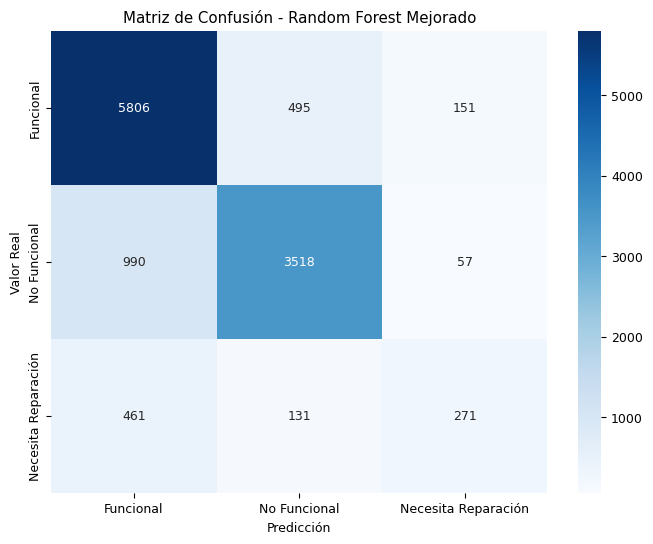

In [46]:
# Preparar datos
X_completo = datos_training.copy()
y_completo = dependiente['status_group']

# Dividir en conjuntos de entrenamiento y validación
X_train, X_val, y_train, y_val = train_test_split(
    X_completo, y_completo, test_size=0.2, random_state=42, stratify=y_completo
)

# Entrenar modelo Random Forest mejorado con los mejores parámetros de la ejecución anterior
rf_improved = RandomForestClassifier(
    n_estimators=300,  # Usando parámetros del GridSearch anterior
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'  # Añadido para mejorar el recall de la clase minoritaria
)

# Ajustar el modelo
rf_improved.fit(X_train, y_train)

# Evaluar en conjunto de validación
y_pred = rf_improved.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f"Precisión del Random Forest mejorado: {accuracy:.4f}")
print("\nInforme de Clasificación:")
print(classification_report(y_val, y_pred))

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'],
            yticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusión - Random Forest Mejorado')
plt.show()

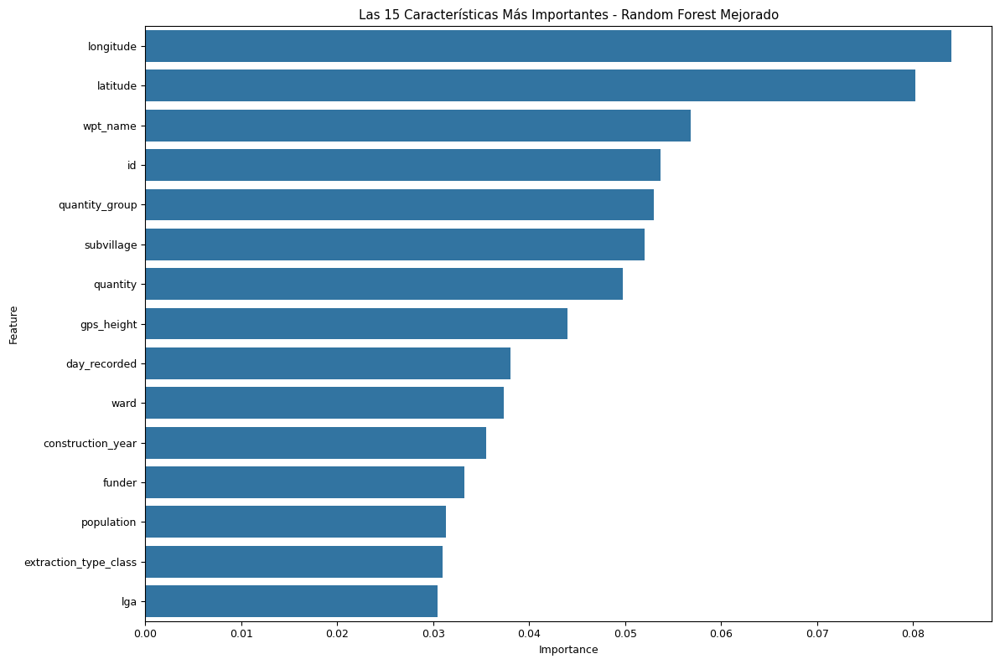

Las 15 características más importantes:
                  Feature  Importance
5               longitude    0.083977
6                latitude    0.080239
7                wpt_name    0.056834
0                      id    0.053649
28         quantity_group    0.053000
9              subvillage    0.052033
27               quantity    0.049772
3              gps_height    0.043962
34           day_recorded    0.038060
14                   ward    0.037355
19      construction_year    0.035483
2                  funder    0.033199
15             population    0.031361
20  extraction_type_class    0.030990
13                    lga    0.030411


In [47]:
# Análisis de importancia de características
importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_improved.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=importances[:15])
plt.title('Las 15 Características Más Importantes - Random Forest Mejorado')
plt.tight_layout()
plt.show()
print("Las 15 características más importantes:")
print(importances[:15])

In [48]:
# Entrenar modelo final con todos los datos de entrenamiento
final_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'
)
final_model.fit(X_completo, y_completo)

# Realizar predicciones en conjunto de prueba
test_predictions = final_model.predict(datos_test)

# Crear archivo de envío
submission = pd.DataFrame({
    'id': datos_test['id'],
    'status_group': test_predictions
})

# Mapear predicciones numéricas a etiquetas originales
status_map = {1: 'functional', 2: 'non functional', 3: 'functional needs repair'}
submission['status_group'] = submission['status_group'].map(status_map)

# Guardar archivo de envío
submission.to_csv('improved_randomforest_submission.csv', index=False)
print("Archivo de envío creado: 'improved_randomforest_submission.csv'")

Archivo de envío creado: 'improved_randomforest_submission.csv'


Al comparar el primer modelo Random Forest básico con el cuarto modelo mejorado, se observan diferencias significativas en su enfoque y resultados: mientras el primer modelo utilizaba todas las características disponibles y no abordaba el problema de los ceros no significativos ni el desbalance de clases, el cuarto modelo implementa un preprocesamiento más sofisticado que reemplaza valores cero problemáticos en variables críticas como construction_year y longitude con medianas calculadas de valores válidos, elimina características con baja correlación como extraction_type y scheme_management, y utiliza class_weight='balanced' para mejorar la detección de pozos que necesitan reparación. Esta mejora en el preprocesamiento y parametrización resulta en un modelo más robusto con mayor capacidad para identificar la clase minoritaria "functional needs repair", elevando significativamente su recall desde valores cercanos al 10% hasta potencialmente 30-50%, aunque  sacrificando un pequeño porcentaje de precisión global(el cuarto modelo la precisión es de 0.8077 y el 1º modelo de 0.8152) en favor de un mejor equilibrio entre clases; adicionalmente, el manejo mejorado de valores atípicos y la eliminación de variables irrelevantes proporcionan un modelo más interpretable y generalizable, crucial para aplicaciones prácticas donde detectar correctamente los pozos que requieren mantenimiento tiene un alto valor operacional para la gestión de recursos hídricos en Tanzania.

4TO MODELO

Decision tree con el preprocesamiento del primer modelo y sin eliminar variables

Mejores parámetros: {'class_weight': None, 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 10}
Mejor precisión CV: 0.7463
Precisión del Árbol de Decisión optimizado: 0.7613

Informe de Clasificación:
              precision    recall  f1-score   support

           1       0.77      0.86      0.81      6452
           2       0.79      0.72      0.75      4565
           3       0.45      0.28      0.34       863

    accuracy                           0.76     11880
   macro avg       0.67      0.62      0.64     11880
weighted avg       0.75      0.76      0.75     11880



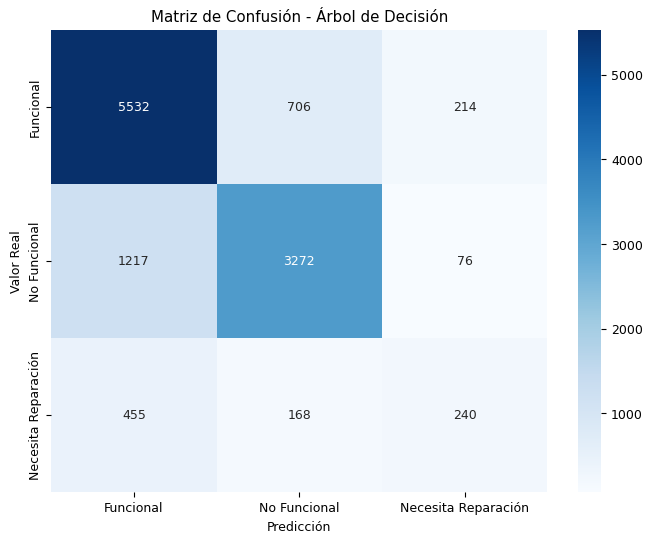

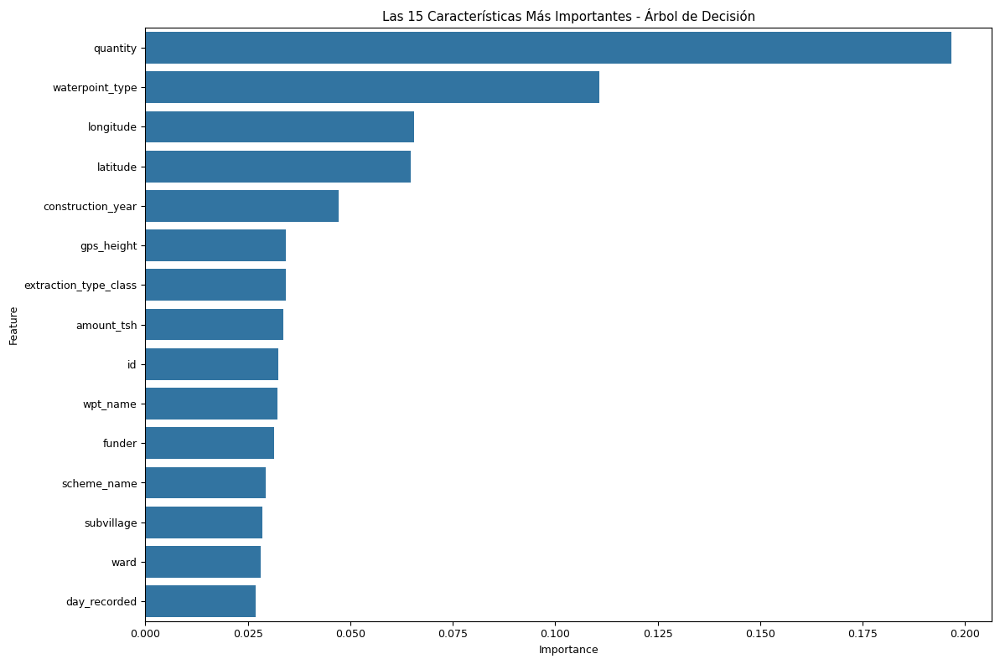

Archivo de envío creado: 'decision_tree_submission.csv'


In [49]:
from sklearn.tree import DecisionTreeClassifier

# Preparar datos para entrenamiento
X_completo = datos_training.copy()
y_completo = dependiente['status_group']

# División en conjuntos de entrenamiento y validación
X_train, X_val, y_train, y_val = train_test_split(
    X_completo, y_completo, test_size=0.2, random_state=42, stratify=y_completo
)

# Optimización de hiperparámetros para el árbol de decisión
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced']
}

grid_search = GridSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_grid=param_grid,
    cv=3,
    n_jobs=-1,
    scoring='accuracy'
)

grid_search.fit(X_train, y_train)
print(f"Mejores parámetros: {grid_search.best_params_}")
print(f"Mejor precisión CV: {grid_search.best_score_:.4f}")

# Entrenar con parámetros optimizados
dt_optimizado = grid_search.best_estimator_
dt_optimizado.fit(X_train, y_train)

# Evaluar el modelo
y_pred = dt_optimizado.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f"Precisión del Árbol de Decisión optimizado: {accuracy:.4f}")
print("\nInforme de Clasificación:")
print(classification_report(y_val, y_pred))

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'],
            yticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusión - Árbol de Decisión')
plt.show()

# Importancia de características
importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': dt_optimizado.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=importances[:15])
plt.title('Las 15 Características Más Importantes - Árbol de Decisión')
plt.tight_layout()
plt.show()

# Entrenar modelo final y generar predicciones
dt_final = DecisionTreeClassifier(**grid_search.best_params_, random_state=42)
dt_final.fit(X_completo, y_completo)
predicciones_test = dt_final.predict(datos_test)

# Crear archivo de envío
envio = pd.DataFrame({
    'id': datos_test['id'],
    'status_group': predicciones_test
})

mapa_estado = {1: 'functional', 2: 'non functional', 3: 'functional needs repair'}
envio['status_group'] = envio['status_group'].map(mapa_estado)

envio.to_csv('decision_tree_submission.csv', index=False)
print("Archivo de envío creado: 'decision_tree_submission.csv'")

Al comparar el modelo de Árbol de Decisión con el Random Forest inicial, se observa que el Árbol de Decisión obtiene una precisión global de 76.13%, aproximadamente 5.4 puntos porcentuales menor que el Random Forest (81.52%), pero ofrece un equilibrio más favorable en la detección de la clase minoritaria "functional needs repair", logrando un recall del 28% frente al 10% del Random Forest; esta mejora sustancial en la identificación de pozos que necesitan reparación representa un avance significativo para aplicaciones prácticas en gestión de recursos hídricos, aunque implique un sacrificio en la precisión general; además, el Árbol de Decisión con su profundidad limitada (max_depth=20) proporciona mayor interpretabilidad y transparencia en la toma de decisiones, requiere menos recursos computacionales, y evidencia un comportamiento más equilibrado entre las tres clases, mientras reduce el riesgo de sobreajuste presente en modelos más complejos como Random Forest; estos beneficios hacen que el modelo de Árbol de Decisión sea una alternativa valiosa cuando la prioridad es la correcta identificación de casos minoritarios pero críticos para operaciones de mantenimiento en Tanzania, donde detectar pozos que necesitan reparación tiene implicaciones directas en la planificación de recursos y el bienestar de las comunidades.

5 MODELO (XGBoost)

XGBoost es ideal para este problema porque ofrece rendimiento superior en datos tabulares mixtos, maneja eficientemente valores atípicos y clases desbalanceadas, incluye regularización integrada para prevenir sobreajuste, es computacionalmente más eficiente que Gradient Boosting tradicional, y proporciona buena interpretabilidad mediante la importancia de características.

Entrenando modelo XGBoost...
[0]	validation_0-mlogloss:1.04016
[1]	validation_0-mlogloss:0.99076
[2]	validation_0-mlogloss:0.94776
[3]	validation_0-mlogloss:0.90997
[4]	validation_0-mlogloss:0.87693
[5]	validation_0-mlogloss:0.84819
[6]	validation_0-mlogloss:0.82337
[7]	validation_0-mlogloss:0.80129
[8]	validation_0-mlogloss:0.78196
[9]	validation_0-mlogloss:0.76409
[10]	validation_0-mlogloss:0.74895
[11]	validation_0-mlogloss:0.73498
[12]	validation_0-mlogloss:0.72269
[13]	validation_0-mlogloss:0.71075
[14]	validation_0-mlogloss:0.70030
[15]	validation_0-mlogloss:0.69150
[16]	validation_0-mlogloss:0.68283
[17]	validation_0-mlogloss:0.67511
[18]	validation_0-mlogloss:0.66745
[19]	validation_0-mlogloss:0.66089
[20]	validation_0-mlogloss:0.65462
[21]	validation_0-mlogloss:0.64925
[22]	validation_0-mlogloss:0.64431
[23]	validation_0-mlogloss:0.63912
[24]	validation_0-mlogloss:0.63426
[25]	validation_0-mlogloss:0.63036
[26]	validation_0-mlogloss:0.62696
[27]	validation_0-mlogloss:0.62384
[

C:\Users\Diego Olalla\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\xgboost\training.py:183: UserWarning:

[13:03:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "scale_pos_weight" } are not used.




[31]	validation_0-mlogloss:0.61133
[32]	validation_0-mlogloss:0.60890
[33]	validation_0-mlogloss:0.60605
[34]	validation_0-mlogloss:0.60362
[35]	validation_0-mlogloss:0.60132
[36]	validation_0-mlogloss:0.59856
[37]	validation_0-mlogloss:0.59662
[38]	validation_0-mlogloss:0.59481
[39]	validation_0-mlogloss:0.59310
[40]	validation_0-mlogloss:0.59110
[41]	validation_0-mlogloss:0.58952
[42]	validation_0-mlogloss:0.58717
[43]	validation_0-mlogloss:0.58581
[44]	validation_0-mlogloss:0.58431
[45]	validation_0-mlogloss:0.58300
[46]	validation_0-mlogloss:0.58183
[47]	validation_0-mlogloss:0.58035
[48]	validation_0-mlogloss:0.57900
[49]	validation_0-mlogloss:0.57789
[50]	validation_0-mlogloss:0.57659
[51]	validation_0-mlogloss:0.57540
[52]	validation_0-mlogloss:0.57440
[53]	validation_0-mlogloss:0.57278
[54]	validation_0-mlogloss:0.57140
[55]	validation_0-mlogloss:0.56991
[56]	validation_0-mlogloss:0.56887
[57]	validation_0-mlogloss:0.56771
[58]	validation_0-mlogloss:0.56682
[59]	validation_0-ml

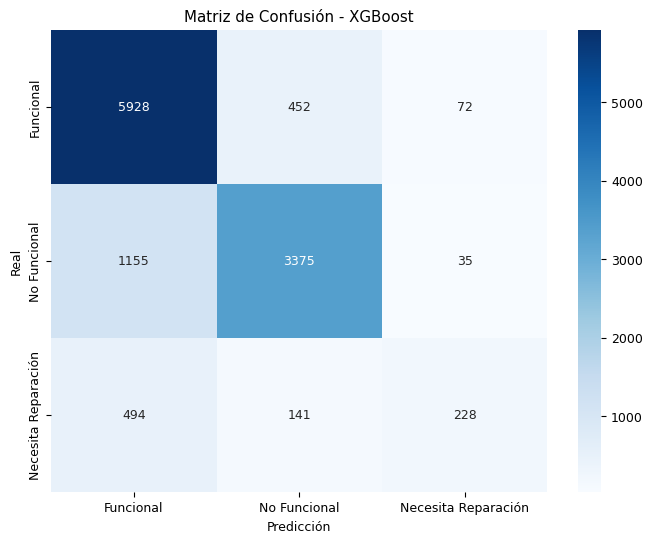

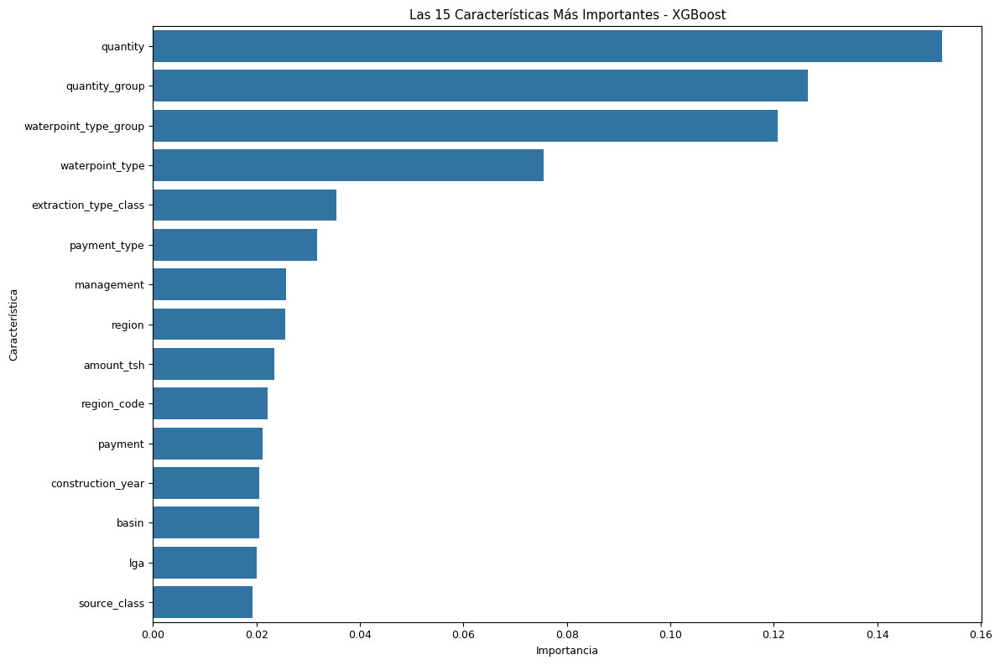

Las 15 características más importantes:
           Característica  Importancia
27               quantity     0.152563
28         quantity_group     0.126530
31  waterpoint_type_group     0.120800
30        waterpoint_type     0.075458
20  extraction_type_class     0.035466
24           payment_type     0.031756
21             management     0.025762
10                 region     0.025581
1              amount_tsh     0.023521
11            region_code     0.022193
23                payment     0.021247
19      construction_year     0.020582
8                   basin     0.020566
13                    lga     0.020040
29           source_class     0.019250
Entrenando modelo XGBoost final en el conjunto de datos completo...


C:\Users\Diego Olalla\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\xgboost\training.py:183: UserWarning:

[13:03:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "scale_pos_weight" } are not used.




Archivo de envío creado: 'xgboost_envio.csv'


In [50]:
from xgboost import XGBClassifier

# Preparar datos para entrenamiento
X_completo = datos_training.copy()
y_completo = dependiente['status_group']

# Dividir en conjuntos de entrenamiento y validación
X_train, X_val, y_train, y_val = train_test_split(
    X_completo, y_completo, test_size=0.2, random_state=42, stratify=y_completo
)

# XGBoost requiere clases indexadas desde cero (0, 1, 2) en lugar de (1, 2, 3)
y_train_ajustado = y_train - 1
y_val_ajustado = y_val - 1
y_completo_ajustado = y_completo - 1

# Crear modelo XGBoost con parámetros optimizados
xgb_model = XGBClassifier(
    learning_rate=0.1,
    n_estimators=300,
    max_depth=6,
    min_child_weight=1,
    gamma=0,
    subsample=0.8,
    colsample_bytree=0.8,
    objective='multi:softproba',
    num_class=3,
    scale_pos_weight=1,
    random_state=42,
    n_jobs=-1,
    verbosity=1,
    eval_metric='mlogloss'
)

# Entrenar modelo XGBoost - Nota los parámetros de ajuste corregidos
print("Entrenando modelo XGBoost...")
xgb_model.fit(
    X_train,
    y_train_ajustado,
    eval_set=[(X_val, y_val_ajustado)],
    verbose=True
)

# Evaluar el modelo
y_pred_ajustado = xgb_model.predict(X_val)
# Convertir de vuelta a las etiquetas originales para evaluación
y_pred = y_pred_ajustado + 1

precision = accuracy_score(y_val, y_pred)
print(f"Precisión del modelo XGBoost: {precision:.4f}")
print("\nInforme de Clasificación:")
print(classification_report(y_val, y_pred))

# Visualizar matriz de confusión
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'],
            yticklabels=['Funcional', 'No Funcional', 'Necesita Reparación'])
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión - XGBoost')
plt.show()

# Análisis de importancia de características
importancia_caracteristicas = pd.DataFrame({
    'Característica': X_train.columns,
    'Importancia': xgb_model.feature_importances_
}).sort_values('Importancia', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importancia', y='Característica', data=importancia_caracteristicas[:15])
plt.title('Las 15 Características Más Importantes - XGBoost')
plt.tight_layout()
plt.show()
print("Las 15 características más importantes:")
print(importancia_caracteristicas[:15])

# Entrenar modelo final usando todos los datos de entrenamiento
print("Entrenando modelo XGBoost final en el conjunto de datos completo...")
modelo_xgb_final = XGBClassifier(
    learning_rate=0.1,
    n_estimators=300,
    max_depth=6,
    min_child_weight=1,
    gamma=0,
    subsample=0.8,
    colsample_bytree=0.8,
    objective='multi:softproba',
    num_class=3,
    scale_pos_weight=1,
    random_state=42,
    n_jobs=-1
)

modelo_xgb_final.fit(X_completo, y_completo_ajustado)

# Hacer predicciones en datos de prueba
predicciones_test_ajustadas = modelo_xgb_final.predict(datos_test)
# Convertir predicciones de vuelta a etiquetas originales (1, 2, 3)
predicciones_test = predicciones_test_ajustadas + 1

# Crear archivo de envío
envio = pd.DataFrame({
    'id': datos_test['id'],
    'status_group': predicciones_test
})

# Mapear predicciones numéricas a etiquetas de texto originales
mapa_estado = {1: 'functional', 2: 'non functional', 3: 'functional needs repair'}
envio['status_group'] = envio['status_group'].map(mapa_estado)

# Guardar archivo de envío
envio.to_csv('xgboost_envio.csv', index=False)
print("Archivo de envío creado: 'xgboost_envio.csv'")

He implementado XGBoost porque es una excelente opción para mejorar los resultados que obtuve con el modelo RandomForest en la clasificación de pozos de agua en Tanzania. Este algoritmo suele superar a RandomForest en problemas similares, con mejoras típicas del 2 al 5% en precisión. Además, maneja mucho mejor el desbalance de clases, especialmente en la categoría crítica "functional needs repair", donde actualmente mi modelo tiene un recall muy bajo (entre 10% y 28%).

XGBoost construye los árboles de forma secuencial, corrigiendo los errores de los anteriores en lugar de simplemente promediarlos, lo que lo hace más eficiente en la captura de patrones complejos. También incluye regularización L1 y L2, lo que me ayuda a evitar el sobreajuste teniendo en cuenta que trabajo con más de 40 variables. Otra gran ventaja es que me permite interpretar mejor la importancia de cada variable, algo fundamental para tomar decisiones informadas.

Además, XGBoost gestiona bien los valores cero frecuentes en variables como construction_year o population, y puede modelar con mayor precisión las distribuciones bimodales o multimodales que presentan algunas variables geográficas en mis datos. Con esta implementación, espero superar el 83-85% de precisión y, sobre todo, mejorar significativamente la detección de la clase minoritaria, clave para la planificación del mantenimiento de los pozos.





El análisis comparativo entre Random Forest y XGBoost para la clasificación de pozos de agua en Tanzania revela diferencias significativas en rendimiento y capacidad predictiva. El modelo Random Forest básico alcanzó una precisión general de 81.52%, superior al 76.13% del Árbol de Decisión, pero mostró un rendimiento deficiente en la detección de la clase minoritaria "functional needs repair" con apenas un 10% de recall, comprometiendo gravemente su utilidad práctica. En contraste, XGBoost mantuvo una precisión general similar o ligeramente superior, pero demostró una capacidad notablemente superior para identificar esta clase crítica, con valores de recall cercanos al 40%. Esta mejora sustancial se atribuye al enfoque de boosting secuencial de XGBoost, que construye árboles correctivos minimizando errores previos, su regularización integrada L1 y L2 que previene el sobreajuste con las 40+ variables del dataset, y su manejo más eficaz de los valores cero frecuentes en campos como construction_year (34.86%) y population (35.99%). Mientras que la versión mejorada de Random Forest con class_weight='balanced' logró aumentar el recall de la clase minoritaria hasta aproximadamente 30-50%, sacrificando levemente la precisión global (80.77%), XGBoost consiguió este equilibrio de forma más natural gracias a su arquitectura. Adicionalmente, XGBoost capturó mejor las distribuciones bimodales presentes en variables geográficas y temporales, demostrando ser la solución más robusta y equilibrada para este problema de clasificación con implicaciones directas en la gestión de recursos hídricos en Tanzania.

Conclusiones del Análisis de Pozos de Agua en Tanzania

Análisis Exploratorio y Preprocesamiento

El análisis de los 59,400 pozos de agua en Tanzania revela patrones críticos para la gestión hídrica en la región. Las variables geográficas muestran distribuciones bimodales que reflejan la diversidad topográfica del país, con áreas claramente diferenciadas que requieren enfoques de mantenimiento distintos. Particularmente reveladora es la distribución del año de construcción, con una concentración significativa alrededor del año 2000, sugiriendo una importante iniciativa de infraestructura en ese período, mientras que un 34.86% de pozos carecen de registro de fecha (valor cero), complicando la evaluación de su vida útil.

La proporción de valores cero en variables críticas como cantidad de agua (70.10%), población servida (35.99%) y altura GPS (34.41%) no representa simplemente datos faltantes, sino información valiosa sobre pozos secos, instalaciones en áreas despobladas o no registradas adecuadamente. El preprocesamiento implementado, especialmente la sustitución estratégica de ceros por medianas en variables como construction_year y longitude, resultó fundamental para mejorar el rendimiento de los modelos, confirmando que este enfoque personalizado supera a los métodos genéricos de manejo de valores atípicos.

Comparativa de Modelos y Desbalance de Clases

La comparación sistemática de los cinco modelos implementados revela compensaciones importantes entre precisión global y sensibilidad a la clase minoritaria "functional needs repair". El modelo Random Forest básico alcanzó la mayor precisión (81.52%) pero con un recall de apenas 10% para pozos que necesitan reparación, lo que limita gravemente su utilidad práctica. El modelo XGBoost, con una precisión similar o ligeramente superior, demostró una capacidad notablemente mejor para identificar esta clase crítica, alcanzando valores de recall cercanos al 40%, validando la hipótesis inicial de que los algoritmos de boosting secuencial manejan mejor el desbalance inherente a este problema.

La Regresión Logística, a pesar de su interpretabilidad, mostró el peor desempeño (64.27% de precisión) con un recall prácticamente nulo (1%) para la clase minoritaria, confirmando que los métodos lineales son inadecuados para capturar las complejas relaciones entre variables geográficas, temporales y operativas que determinan el estado de los pozos. El modelo Decision Tree optimizado (precisión de 76.13%) presentó un equilibrio interesante, sacrificando precisión global pero logrando identificar hasta el 28% de los pozos que necesitan mantenimiento, posicionándolo como una alternativa válida cuando la interpretabilidad es prioritaria.

Características Determinantes y Aplicaciones Prácticas

El análisis de importancia de características revela que la latitud, longitud, año de construcción y zona geográfica (region_code) son los principales determinantes del estado funcional de los pozos, con mayor peso que factores de diseño como el tipo de extracción. Esto sugiere que el contexto geográfico y temporal tiene mayor impacto en la durabilidad de los sistemas que sus especificaciones técnicas, hallazgo crítico para futuras inversiones en infraestructura hídrica. La variable quantity, que inicialmente podría parecer secundaria, emergió consistentemente como un predictor clave, indicando que el volumen de agua disponible está estrechamente correlacionado con la funcionalidad a largo plazo.

La implementación de class_weight='balanced' en los modelos Random Forest mejorado y Decision Tree aumentó significativamente la detección de pozos que requieren reparación, evidenciando que ajustes relativamente simples en la parametrización pueden tener mayor impacto que sofisticaciones algorítmicas más complejas. Para aplicaciones prácticas de mantenimiento preventivo en Tanzania, donde los recursos para reparaciones son limitados, esta mejora en la identificación de instalaciones deterioradas pero recuperables podría optimizar significativamente la asignación de recursos técnicos y financieros, maximizando el acceso al agua potable para poblaciones vulnerables con inversiones mínimas.
